In [1]:
from torchvision import transforms
from data import CustomDataset
from torch.utils.data import Dataset, DataLoader, RandomSampler, SequentialSampler
import torch 
from train import create_model
import matplotlib.pyplot as plt 
import matplotlib.patches as patches 
import numpy as np
from tqdm import tqdm 
from torchvision.ops import box_iou
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from collections import defaultdict
import seaborn as sns
import shapely 
import warnings
warnings.filterwarnings("ignore")

In [2]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [3]:
class_names = ['background','Capacitor', 'Cylinder', 'Motor', 'Shock absorber', 'container']

In [4]:
label2idx = {label: idx for idx, label in enumerate(class_names)}
idx2label = {idx: label for idx, label in enumerate(class_names)}
idx2label

{0: 'background',
 1: 'Capacitor',
 2: 'Cylinder',
 3: 'Motor',
 4: 'Shock absorber',
 5: 'container'}

In [5]:
TEST_IMAGES = "/home/shirshak/Thesis_Data/Steel_Scrap_detection/test/images"
TEST_LABELS = "/home/shirshak/Thesis_Data/Steel_Scrap_detection/test/labels"

In [6]:
test_transforms = transforms.Compose([
        transforms.ToTensor(),
        # transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])

test_dataset = CustomDataset(TEST_IMAGES, TEST_LABELS, (640, 640), transforms=test_transforms)
test_loader = DataLoader(test_dataset, batch_size=1, num_workers=0, shuffle=False)

In [7]:
model = create_model(num_classes=6)
model.to(device)
checkpoint_path = "./recent_epoch_model.pth"
checkpoint = torch.load(checkpoint_path, weights_only=False)
model.load_state_dict(checkpoint['model_state_dict'])

<All keys matched successfully>

In [8]:
model

FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (4): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (

In [9]:
def calculate_metrics(predictions, targets, iou_threshold=0.5, num_classes=6):
    """
    Calculate precision, recall, AP for object detection
    """
    all_precisions = []
    all_recalls = []
    all_aps = []
    all_f1_scores = []
    
    for pred, target in zip(predictions, targets):
        pred_boxes = pred['boxes']
        pred_scores = pred['scores']
        pred_labels = pred['labels']
        
        true_boxes = target['boxes']
        true_labels = target['labels']
        
        class_precisions = []
        class_recalls = []
        class_aps = []
        class_f1s = []
        
        for class_id in range(num_classes):
            # Filter predictions and targets for current class
            pred_mask = pred_labels == class_id
            true_mask = true_labels == class_id
            
            pred_boxes_class = pred_boxes[pred_mask]
            pred_scores_class = pred_scores[pred_mask]
            true_boxes_class = true_boxes[true_mask]
            
            if len(true_boxes_class) == 0 and len(pred_boxes_class) == 0:
                # No ground truth and no predictions for this class
                class_precisions.append(1.0)
                class_recalls.append(1.0)
                class_aps.append(1.0)
                class_f1s.append(1.0)
                continue
            elif len(true_boxes_class) == 0:
                # No ground truth but have predictions (all false positives)
                class_precisions.append(0.0)
                class_recalls.append(0.0)
                class_aps.append(0.0)
                class_f1s.append(0.0)
                continue
            elif len(pred_boxes_class) == 0:
                # Have ground truth but no predictions (all false negatives)
                class_precisions.append(0.0)
                class_recalls.append(0.0)
                class_aps.append(0.0)
                class_f1s.append(0.0)
                continue
            
            # Calculate IoU between all predicted and true boxes for this class
            if len(pred_boxes_class) > 0 and len(true_boxes_class) > 0:
                ious = box_iou(pred_boxes_class, true_boxes_class)
                
                # Sort predictions by confidence score (descending)
                sorted_indices = torch.argsort(pred_scores_class, descending=True)
                
                tp = 0
                fp = 0
                matched_gt = set()
                
                precisions = []
                recalls = []
                
                for idx in sorted_indices:
                    best_iou, best_gt_idx = torch.max(ious[idx], dim=0)
                    
                    if best_iou >= iou_threshold and best_gt_idx.item() not in matched_gt:
                        tp += 1
                        matched_gt.add(best_gt_idx.item())
                    else:
                        fp += 1
            
                    precision = tp / (tp + fp) if (tp + fp) > 0 else 0
                    recall = tp / len(true_boxes_class) if len(true_boxes_class) > 0 else 0
                    
                    precisions.append(precision)
                    recalls.append(recall)
                
                if len(precisions) > 0:
                    # Calculate AP using precision-recall curve
                    precisions = np.array(precisions)
                    recalls = np.array(recalls)
                    
                    # Add points at recall 0 and 1
                    precisions = np.concatenate(([0], precisions, [0]))
                    recalls = np.concatenate(([0], recalls, [1]))
                    
                    # Compute AP using trapezoidal rule
                    ap = np.trapezoid(precisions, recalls)
                    
                    final_precision = precisions[-2] if len(precisions) > 1 else 0
                    final_recall = recalls[-2] if len(recalls) > 1 else 0
                    f1 = 2 * (final_precision * final_recall) / (final_precision + final_recall) if (final_precision + final_recall) > 0 else 0
                    
                    class_precisions.append(final_precision)
                    class_recalls.append(final_recall)
                    class_aps.append(ap)
                    class_f1s.append(f1)
                else:
                    class_precisions.append(0.0)
                    class_recalls.append(0.0)
                    class_aps.append(0.0)
                    class_f1s.append(0.0)
            else:
                class_precisions.append(0.0)
                class_recalls.append(0.0)
                class_aps.append(0.0)
                class_f1s.append(0.0)
        
        all_precisions.append(np.mean(class_precisions))
        all_recalls.append(np.mean(class_recalls))
        all_aps.append(np.mean(class_aps))
        all_f1_scores.append(np.mean(class_f1s))
    
    return {
        'precision': np.mean(all_precisions),
        'recall': np.mean(all_recalls),
        'mAP': np.mean(all_aps),
        'f1_score': np.mean(all_f1_scores), 
    }

In [10]:
def visualize_predictions(image, boxes, labels, scores, threshold=0.5):
    """
    Visualize bounding boxes on image
    """
    # Convert tensor to PIL Image if needed
    if isinstance(image, torch.Tensor):
        if image.is_cuda:
            image = image.cpu()
        # Assuming image is in format [C, H, W]
        image = image.permute(1, 2, 0).numpy()
        if image.max() <= 1.0:
            image = (image * 255).astype(np.uint8)
    
    fig, ax = plt.subplots(1, 1, figsize=(12, 8))
    ax.imshow(image)
    
    # Filter predictions by confidence threshold
    valid_indices = scores >= threshold
    boxes = boxes[valid_indices]
    labels = labels[valid_indices]
    scores = scores[valid_indices]
    
    # Draw bounding boxes
    for box, label, score in zip(boxes, labels, scores):
        x1, y1, x2, y2 = box
        width = x2 - x1
        height = y2 - y1
        
        # Create rectangle patch
        rect = patches.Rectangle((x1, y1), width, height, 
                               linewidth=2, edgecolor='red', facecolor='none')
        ax.add_patch(rect)
        
        # Add label and score
        label_text = f'{class_names[label]}: {score:.2f}'
        ax.text(x1, y1-5, label_text, fontsize=10, color='red', 
                bbox=dict(boxstyle="round,pad=0.3", facecolor='white', alpha=0.7))
    
    ax.set_title(f'Predictions (threshold: {threshold})')
    ax.axis('off')
    plt.tight_layout()
    plt.show()

In [11]:
def calculate_map_at_different_ious(predictions, targets, num_classes=7):
    """Calculate mAP at different IoU thresholds (0.5:0.05:0.95)"""
    iou_thresholds = np.arange(0.5, 1.0, 0.05)
    aps = []
    for iou_thresh in iou_thresholds:
        metrics = calculate_metrics(predictions, targets, iou_threshold=iou_thresh, num_classes=num_classes)
        aps.append(metrics['mAP'])
    return np.mean(aps) 

In [12]:
def plot_confusion_matrix(cm, class_names):
    import matplotlib.pyplot as plt
    import seaborn as sns

    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=class_names, yticklabels=class_names)
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.title('Confusion Matrix')
    plt.tight_layout()
    plt.show()


Testing:   3%|▎         | 1/34 [00:00<00:19,  1.69it/s]


Image 1:
Number of detections (confidence > 0.2): 0
No detections above threshold

Image 2:
Number of detections (confidence > 0.2): 10
Predictions:
  1. Class: Cylinder (ID: 2), Score: 0.976, Box: [381.0, 386.4, 536.0, 564.9]
  2. Class: Cylinder (ID: 2), Score: 0.973, Box: [375.0, 368.3, 541.0, 416.7]
  3. Class: Cylinder (ID: 2), Score: 0.946, Box: [107.8, 349.3, 327.5, 415.1]
  4. Class: Shock absorber (ID: 4), Score: 0.930, Box: [579.4, 430.2, 635.7, 474.7]
  5. Class: Cylinder (ID: 2), Score: 0.815, Box: [15.9, 350.7, 174.8, 485.7]
  6. Class: Cylinder (ID: 2), Score: 0.791, Box: [92.8, 428.1, 230.2, 548.1]
  7. Class: Cylinder (ID: 2), Score: 0.692, Box: [28.2, 427.1, 305.8, 561.7]
  8. Class: Cylinder (ID: 2), Score: 0.580, Box: [138.0, 424.5, 412.2, 554.4]
  9. Class: Shock absorber (ID: 4), Score: 0.354, Box: [517.5, 375.3, 619.8, 396.8]
  10. Class: Cylinder (ID: 2), Score: 0.243, Box: [547.4, 319.3, 636.2, 357.8]


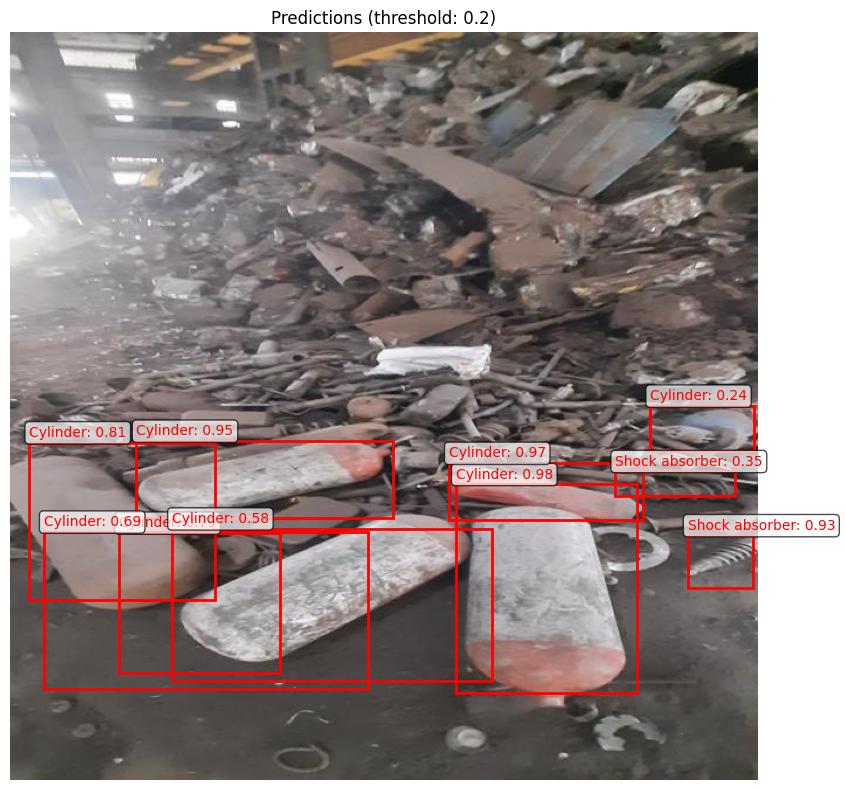

Testing:   6%|▌         | 2/34 [00:01<00:17,  1.88it/s]


Image 3:
Number of detections (confidence > 0.2): 20
Predictions:
  1. Class: Shock absorber (ID: 4), Score: 0.997, Box: [236.2, 220.9, 383.5, 569.0]
  2. Class: Shock absorber (ID: 4), Score: 0.996, Box: [42.2, 89.2, 98.7, 149.0]
  3. Class: Shock absorber (ID: 4), Score: 0.995, Box: [88.6, 39.7, 157.1, 120.1]
  4. Class: Shock absorber (ID: 4), Score: 0.994, Box: [437.7, 425.9, 588.5, 599.0]
  5. Class: Shock absorber (ID: 4), Score: 0.992, Box: [437.5, 288.8, 634.9, 498.9]
  6. Class: Shock absorber (ID: 4), Score: 0.978, Box: [0.0, 188.6, 49.6, 268.2]
  7. Class: Shock absorber (ID: 4), Score: 0.932, Box: [196.0, 457.2, 225.3, 587.5]
  8. Class: Cylinder (ID: 2), Score: 0.915, Box: [144.4, 157.6, 370.8, 272.6]
  9. Class: Shock absorber (ID: 4), Score: 0.877, Box: [1.7, 130.8, 101.1, 279.6]
  10. Class: Shock absorber (ID: 4), Score: 0.755, Box: [443.9, 155.4, 553.0, 265.1]
  11. Class: Shock absorber (ID: 4), Score: 0.548, Box: [415.9, 153.4, 450.4, 167.5]
  12. Class: Shock abso

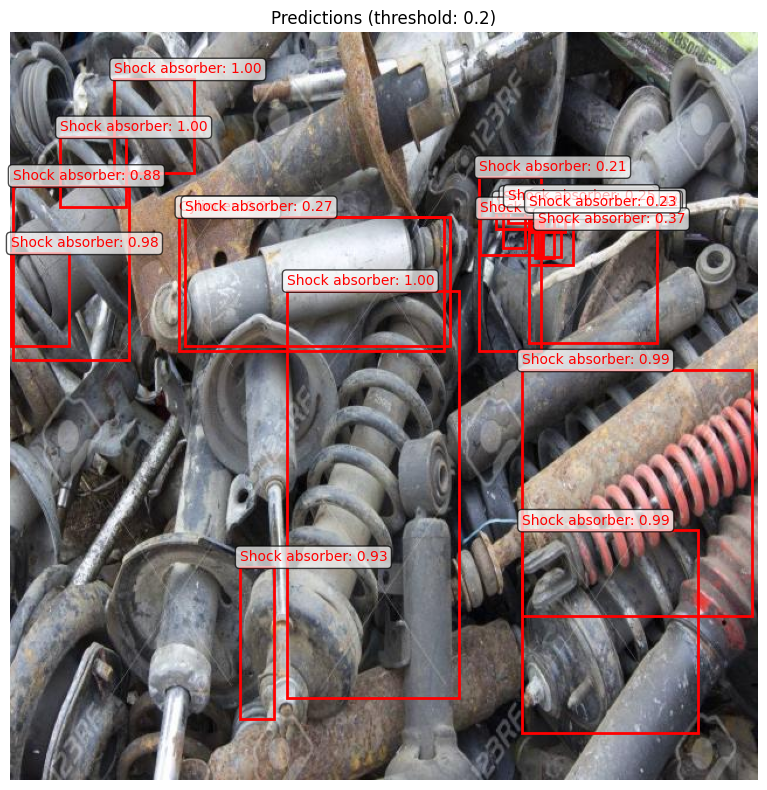

Testing:   9%|▉         | 3/34 [00:01<00:17,  1.75it/s]


Image 4:
Number of detections (confidence > 0.2): 1
Predictions:
  1. Class: container (ID: 5), Score: 0.998, Box: [11.6, 466.9, 146.8, 621.4]


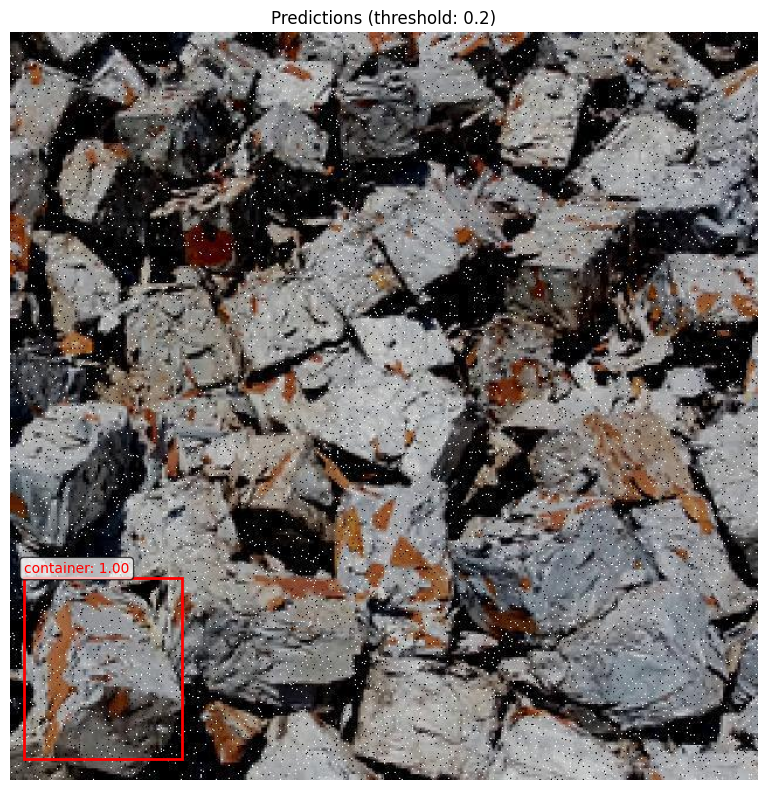

Testing:  12%|█▏        | 4/34 [00:02<00:16,  1.84it/s]


Image 5:
Number of detections (confidence > 0.2): 3
Predictions:
  1. Class: Cylinder (ID: 2), Score: 0.948, Box: [280.2, 292.7, 328.2, 342.9]
  2. Class: Cylinder (ID: 2), Score: 0.926, Box: [386.7, 322.2, 425.2, 357.2]
  3. Class: Cylinder (ID: 2), Score: 0.416, Box: [47.2, 325.4, 105.4, 376.0]


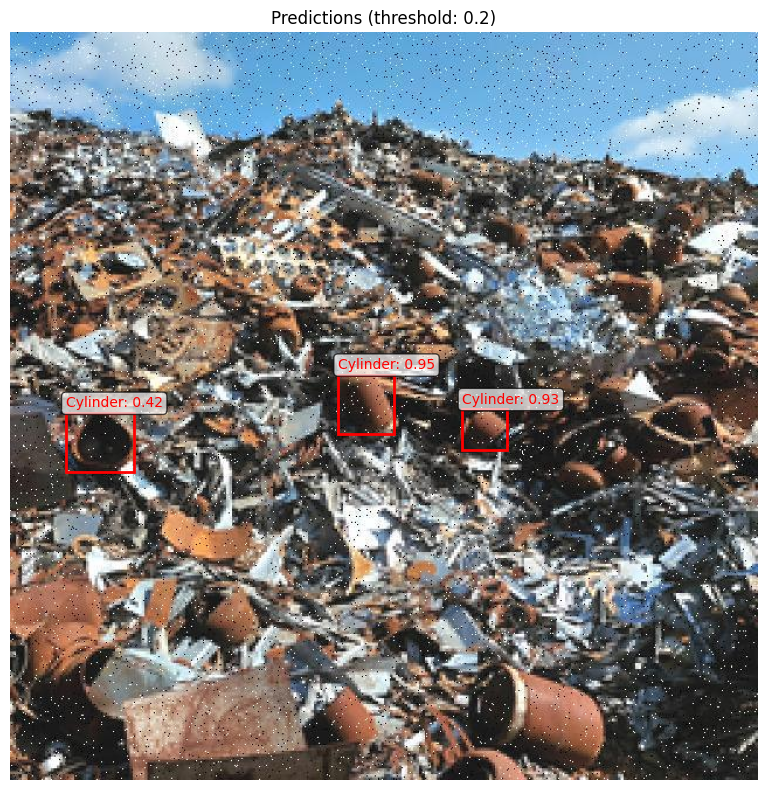

Testing:  29%|██▉       | 10/34 [00:02<00:03,  6.14it/s]


Image 6:
Number of detections (confidence > 0.2): 2
Predictions:
  1. Class: container (ID: 5), Score: 0.999, Box: [428.5, 129.8, 569.4, 188.6]
  2. Class: container (ID: 5), Score: 0.869, Box: [562.2, 130.2, 635.8, 178.9]

Image 7:
Number of detections (confidence > 0.2): 1
Predictions:
  1. Class: Cylinder (ID: 2), Score: 0.465, Box: [246.0, 4.4, 313.0, 82.8]

Image 8:
Number of detections (confidence > 0.2): 4
Predictions:
  1. Class: Cylinder (ID: 2), Score: 0.934, Box: [23.2, 406.1, 156.6, 640.0]
  2. Class: Cylinder (ID: 2), Score: 0.417, Box: [311.4, 527.2, 519.3, 631.4]
  3. Class: Cylinder (ID: 2), Score: 0.373, Box: [481.1, 537.0, 623.6, 630.4]
  4. Class: Cylinder (ID: 2), Score: 0.282, Box: [354.8, 281.1, 468.3, 553.3]

Image 9:
Number of detections (confidence > 0.2): 2
Predictions:
  1. Class: Shock absorber (ID: 4), Score: 0.485, Box: [182.6, 533.9, 285.2, 635.3]
  2. Class: Shock absorber (ID: 4), Score: 0.228, Box: [19.7, 489.7, 105.6, 580.6]

Image 10:
Number of dete

Testing:  38%|███▊      | 13/34 [00:03<00:02,  8.96it/s]


Image 11:
Number of detections (confidence > 0.2): 2
Predictions:
  1. Class: Cylinder (ID: 2), Score: 0.804, Box: [268.2, 318.1, 535.8, 556.9]
  2. Class: Cylinder (ID: 2), Score: 0.291, Box: [118.5, 346.6, 304.6, 577.5]

Image 12:
Number of detections (confidence > 0.2): 1
Predictions:
  1. Class: Cylinder (ID: 2), Score: 0.253, Box: [145.6, 373.4, 192.8, 401.7]

Image 13:
Number of detections (confidence > 0.2): 9
Predictions:
  1. Class: Cylinder (ID: 2), Score: 0.999, Box: [310.8, 191.5, 441.2, 326.8]
  2. Class: Cylinder (ID: 2), Score: 0.979, Box: [440.0, 172.4, 502.1, 261.8]
  3. Class: Cylinder (ID: 2), Score: 0.964, Box: [418.0, 425.3, 517.6, 544.7]
  4. Class: Cylinder (ID: 2), Score: 0.884, Box: [323.9, 94.9, 436.3, 236.0]
  5. Class: Cylinder (ID: 2), Score: 0.782, Box: [217.8, 1.1, 280.2, 43.0]
  6. Class: Cylinder (ID: 2), Score: 0.334, Box: [463.9, 260.5, 566.8, 345.5]
  7. Class: Cylinder (ID: 2), Score: 0.332, Box: [126.2, 200.0, 220.9, 287.9]
  8. Class: Cylinder (I

Testing:  56%|█████▌    | 19/34 [00:03<00:02,  5.61it/s]


Image 16:
Number of detections (confidence > 0.2): 1
Predictions:
  1. Class: Cylinder (ID: 2), Score: 0.221, Box: [293.8, 223.5, 420.8, 305.0]

Image 17:
Number of detections (confidence > 0.2): 8
Predictions:
  1. Class: Cylinder (ID: 2), Score: 0.982, Box: [234.3, 445.1, 522.9, 563.8]
  2. Class: Cylinder (ID: 2), Score: 0.809, Box: [231.9, 323.6, 538.3, 443.0]
  3. Class: Cylinder (ID: 2), Score: 0.673, Box: [204.7, 50.2, 481.7, 220.2]
  4. Class: Cylinder (ID: 2), Score: 0.606, Box: [4.4, 359.1, 259.9, 482.3]
  5. Class: Cylinder (ID: 2), Score: 0.412, Box: [93.6, 513.3, 417.4, 635.4]
  6. Class: Cylinder (ID: 2), Score: 0.305, Box: [199.6, 466.3, 480.2, 607.8]
  7. Class: Cylinder (ID: 2), Score: 0.291, Box: [398.1, 157.3, 523.2, 288.8]
  8. Class: Cylinder (ID: 2), Score: 0.280, Box: [133.1, 12.1, 327.2, 161.8]

Image 18:
Number of detections (confidence > 0.2): 4
Predictions:
  1. Class: Cylinder (ID: 2), Score: 0.993, Box: [328.3, 354.8, 400.7, 483.3]
  2. Class: Cylinder (ID

In [13]:
model.eval()

num = 0
total_predictions = 0
confidence_threshold = 0.2


test_loss = 0.0
test_batches = 0

test_box_loss = 0.0
test_class_loss = 0.0

test_all_predictions = []
test_all_targets = []


with torch.no_grad():
    for images, targets in tqdm(test_loader, desc="Testing"):
        images = images.to(device)
        targets = {k: v.to(device) if isinstance(v, torch.Tensor) else v for k, v in targets.items()}
        
        # Get predictions
        outputs = model(images)

        test_predictions = []
        test_targets = []
        
        for pred in outputs:
            test_predict = {k: v.cpu() for k, v in pred.items()}
            test_predictions.append(test_predict)

        # Handle targets - need to convert to list format for metrics
        if isinstance(targets, dict):
            # If targets is a single dict (batch), convert to list
            test_targ = {k: v.cpu() if isinstance(v, torch.Tensor) else v for k, v in targets.items()}
            test_targets.append(test_targ)
        else:
            # If targets is already a list
            for targ in targets:
                test_targ = {k: v.cpu() if isinstance(v, torch.Tensor) else v for k, v in targ.items()}
                test_targets.append(test_targ)

        test_all_predictions.extend(test_predictions)
        test_all_targets.extend(test_targets)
        

        # Process each image in the batch
        for i, (image, output, target) in enumerate(zip(images, outputs, targets)):
            class_ids = output["labels"].cpu()
            boxes = output["boxes"].cpu()
            scores = output["scores"].cpu()
            
            # Filter by confidence threshold
            valid_mask = scores >= confidence_threshold
            filtered_boxes = boxes[valid_mask]
            filtered_labels = class_ids[valid_mask]
            filtered_scores = scores[valid_mask]
            
            total_predictions += len(filtered_labels)
            
            print(f"\nImage {num + 1}:")
            print(f"Number of detections (confidence > {confidence_threshold}): {len(filtered_labels)}")
            
            if len(filtered_labels) > 0:
                print("Predictions:")
                for j, (box, label, score) in enumerate(zip(filtered_boxes, filtered_labels, filtered_scores)):
                    x1, y1, x2, y2 = box
                    print(f"  {j+1}. Class: {class_names[label]} (ID: {label}), "
                          f"Score: {score:.3f}, Box: [{x1:.1f}, {y1:.1f}, {x2:.1f}, {y2:.1f}]")
                
                # Visualize first few images
                if num < 5:  # Show first 5 images
                    visualize_predictions(image, filtered_boxes, filtered_labels, filtered_scores, confidence_threshold)
            else:
                print("No detections above threshold")
            
            # Print ground truth for comparison
            if 'labels' in target and 'boxes' in target:
                gt_labels = target['labels'].cpu()
                gt_boxes = target['boxes'].cpu()
                print(f"Ground truth objects: {len(gt_labels)}")
                for j, (gt_box, gt_label) in enumerate(zip(gt_boxes, gt_labels)):
                    x1, y1, x2, y2 = gt_box
                    print(f"  GT {j+1}. Class: {class_names[gt_label]} (ID: {gt_label}), "
                          f"Box: [{x1:.1f}, {y1:.1f}, {x2:.1f}, {y2:.1f}]")
            
            num += 1
            
            # Stop after testing a few images for demo
            if num >= 20:  # Test first 10 images
                break
        
        if num >= 20:
            break

In [14]:
test_metrics_50 = calculate_metrics(test_all_predictions, test_all_targets, iou_threshold=0.5)
test_metrics_75 = calculate_metrics(test_all_predictions, test_all_targets, iou_threshold=0.75)
test_map_50_95 = calculate_map_at_different_ious(test_all_predictions, test_all_targets)


In [15]:
# Visualization helper function (optional)
def visualize_polygon_to_bbox_conversion(dataset, idx):
    """
    Helper function to visualize how polygons are converted to bounding boxes
    """
    import matplotlib.pyplot as plt
    import matplotlib.patches as patches
    
    image, target = dataset[idx]
    
    # Convert tensor image back to PIL for visualization
    if isinstance(image, torch.Tensor):
        image_np = image.permute(1, 2, 0).numpy()
        if image_np.max() <= 1.0:
            image_np = (image_np * 255).astype(np.uint8)
    
    fig, ax = plt.subplots(1, 1, figsize=(10, 10))
    ax.imshow(image_np)
    
    # Draw bounding boxes
    for i, box in enumerate(target['boxes']):
        x_min, y_min, x_max, y_max = box
        width = x_max - x_min
        height = y_max - y_min
        
        rect = patches.Rectangle((x_min, y_min), width, height, 
                               linewidth=2, edgecolor='red', facecolor='none')
        ax.add_patch(rect)
        
        # Add label
        label = target['labels'][i].item()
        
        ax.text(x_min, y_min - 5, f'{class_names[label]}', fontsize=10, color='red', bbox=dict(boxstyle="round,pad=0.3", facecolor='white', alpha=0.7))
    
    ax.set_title(f'Polygon to Bounding Box Conversion - Image {idx}')
    plt.axis('off')
    plt.show()

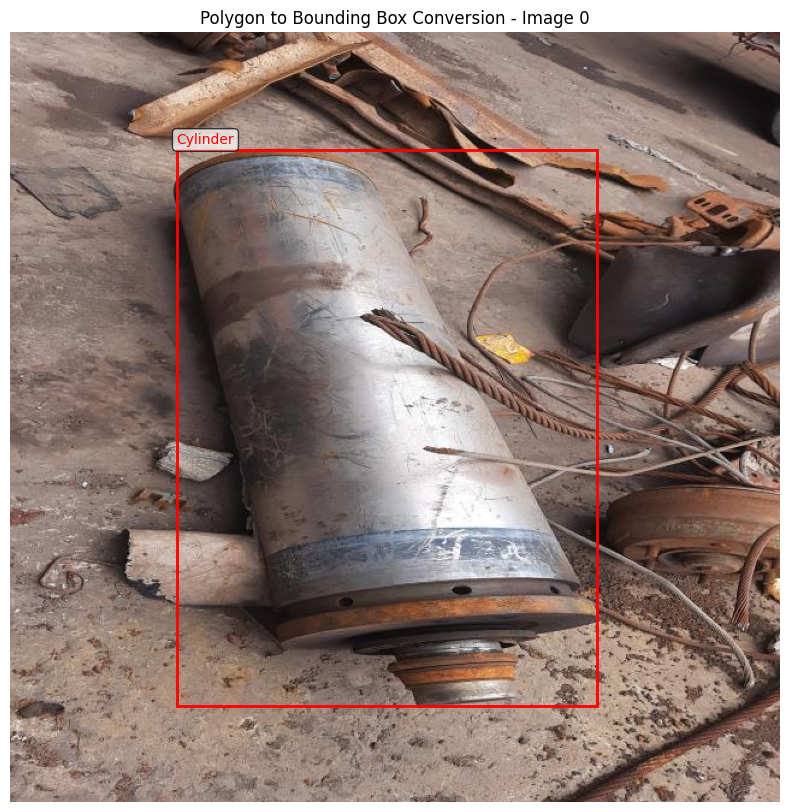

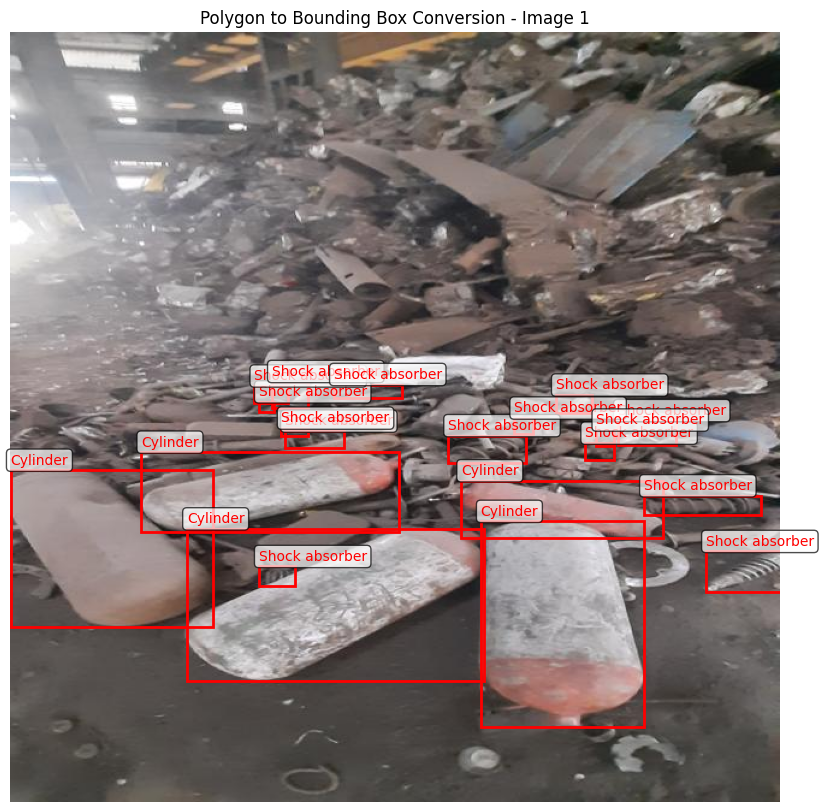

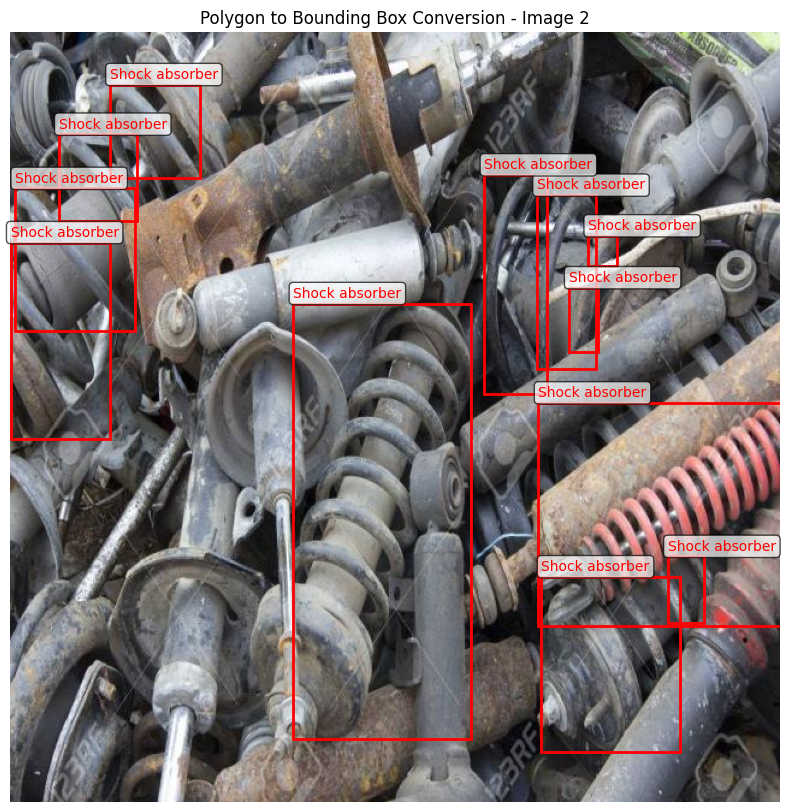

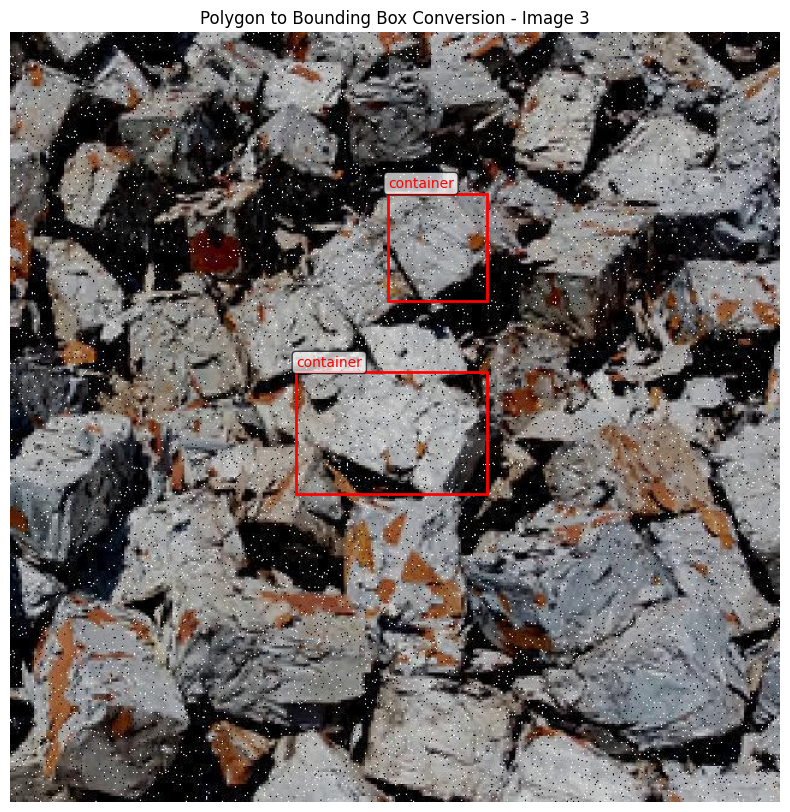

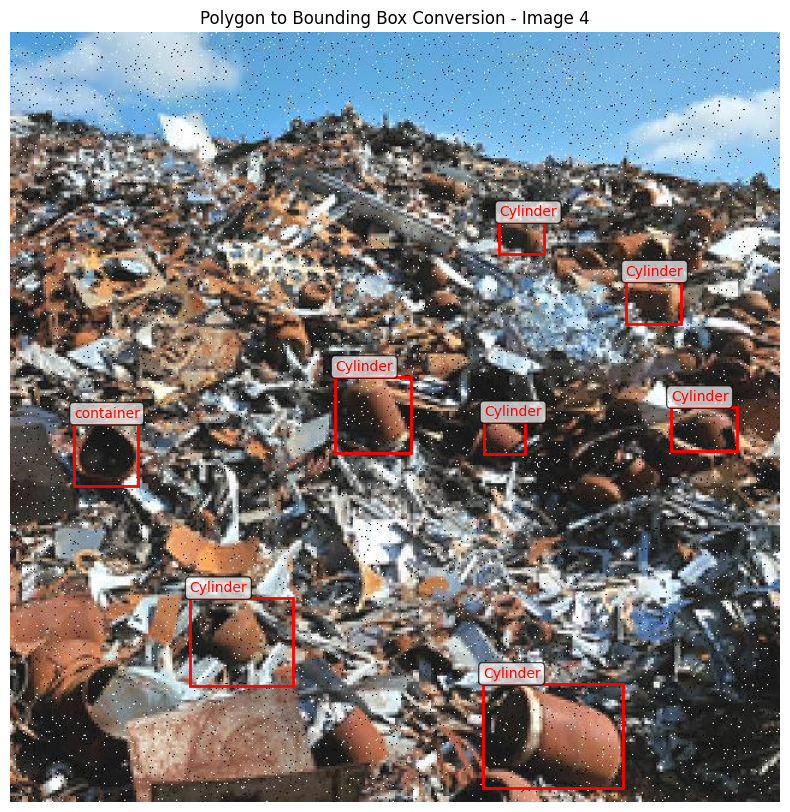

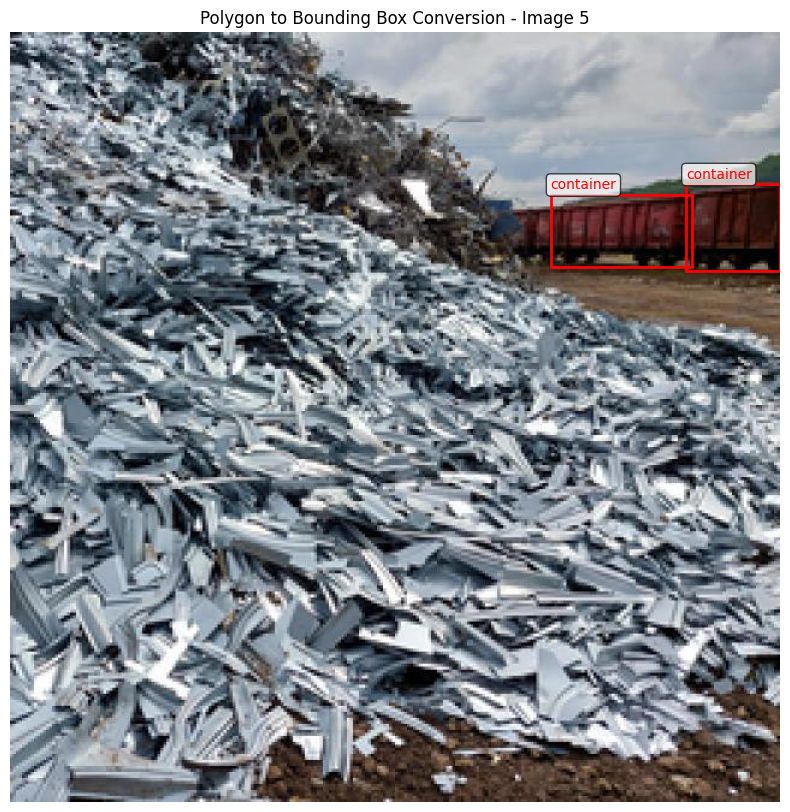

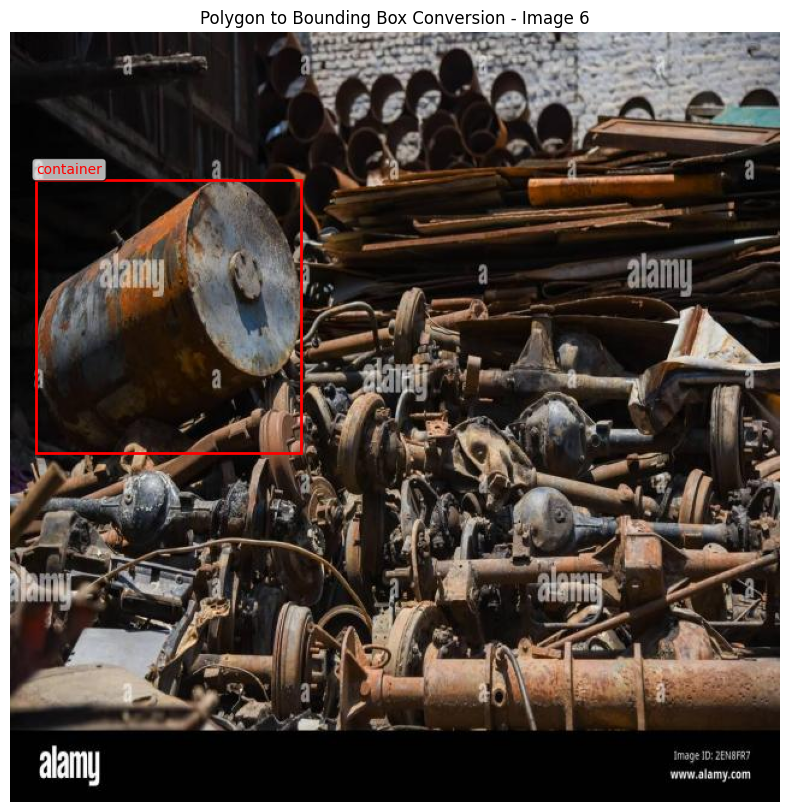

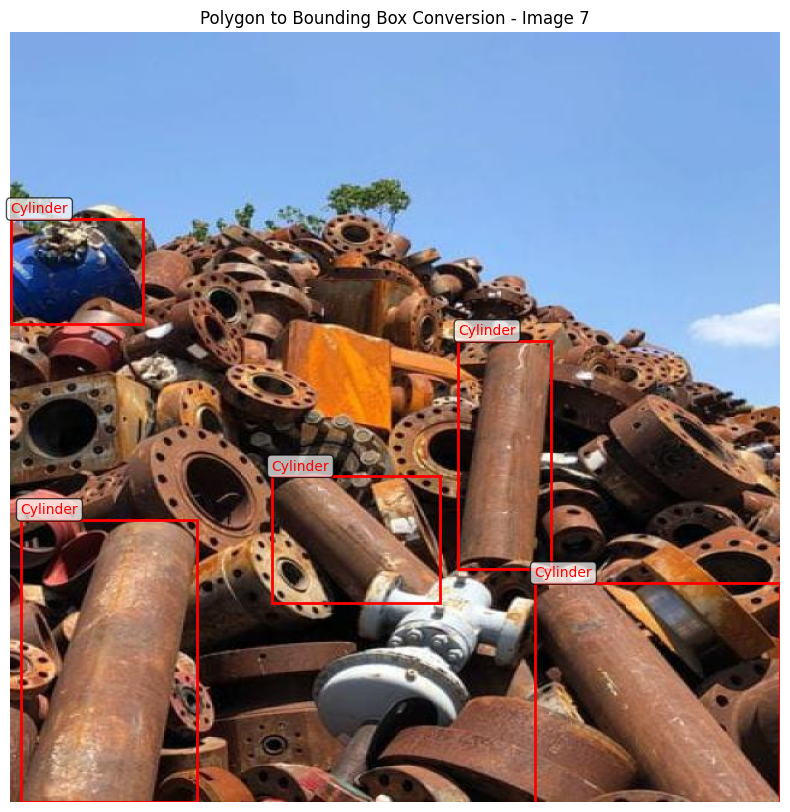

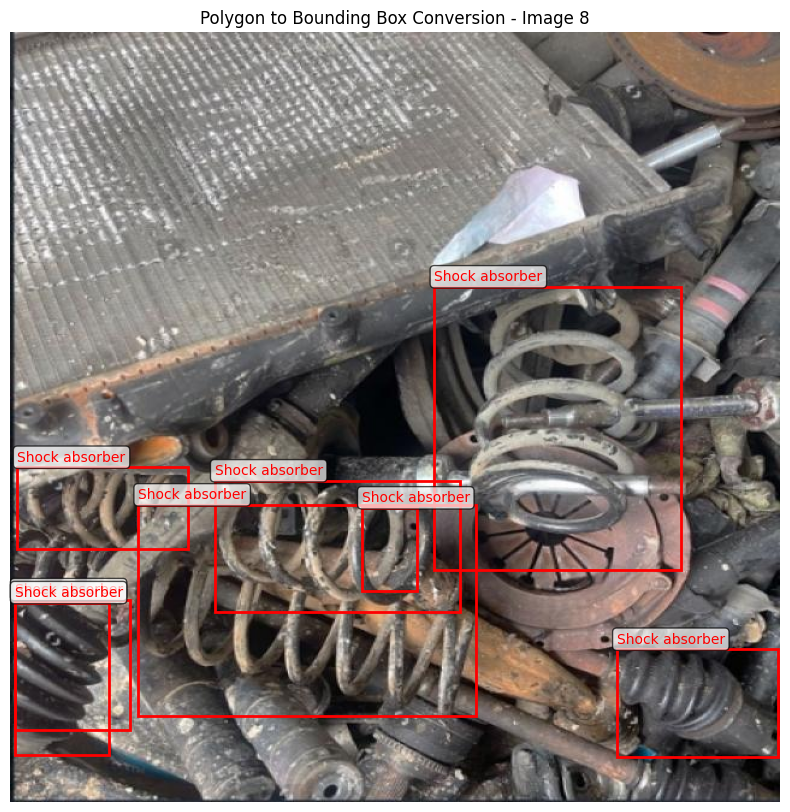

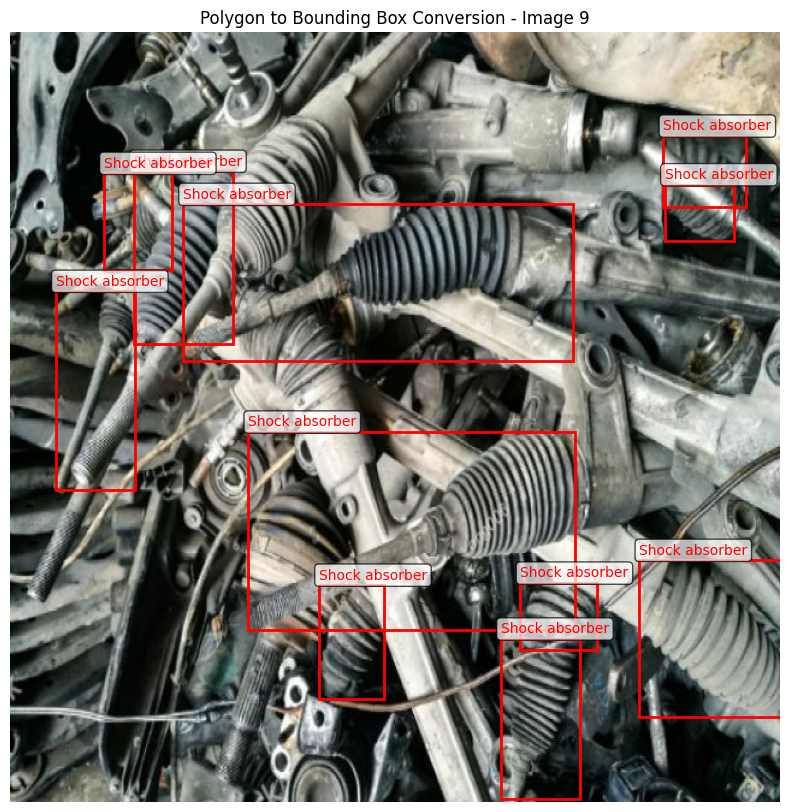

In [16]:
for i in range (10):
    visualize_polygon_to_bbox_conversion(test_dataset, i)